<a href="https://colab.research.google.com/github/Praharshsingh07/Self_Driving_car/blob/main/carmodel.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:


!git clone https://github.com/seraj94ai/Self-driving

Cloning into 'Self-driving'...
remote: Enumerating objects: 15199, done.
remote: Total 15199 (delta 0), reused 0 (delta 0), pack-reused 15199
Receiving objects: 100% (15199/15199), 230.23 MiB | 32.15 MiB/s, done.
Resolving deltas: 100% (63/63), done.
Updating files: 100% (15568/15568), done.


In [2]:
!ls track

ls: cannot access 'track': No such file or directory


In [3]:
!pip3 install imgaug

In [4]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import keras
from keras.models import Sequential
from keras.optimizers import Adam
from keras.layers import Convolution2D, MaxPooling2D, Dropout, Flatten, Dense
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from imgaug import augmenters as iaa
import cv2
import pandas as pd
import ntpath
import random

In [5]:
datadir = 'Self-driving'
columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']
data = pd.read_csv(os.path.join(datadir, 'driving_log.csv'), names = columns)
pd.set_option('display.max_colwidth', -1)
data.head()

<ipython-input-5-c7b748012fbb>:4: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1)


,center,left,right,steering,throttle,reverse,speed
0,C:\Users\seraj\Desktop\simulator-windows-64\IMG\center_2019_02_23_20_23_56_553.jpg,C:\Users\seraj\Desktop\simulator-windows-64\IMG\left_2019_02_23_20_23_56_553.jpg,C:\Users\seraj\Desktop\simulator-windows-64\IMG\right_2019_02_23_20_23_56_553.jpg,0.0,0.0,0.0,1.889167
1,C:\Users\seraj\Desktop\simulator-windows-64\IMG\center_2019_02_23_20_23_56_707.jpg,C:\Users\seraj\Desktop\simulator-windows-64\IMG\left_2019_02_23_20_23_56_707.jpg,C:\Users\seraj\Desktop\simulator-windows-64\IMG\right_2019_02_23_20_23_56_707.jpg,0.0,0.0,0.0,1.858934
2,C:\Users\seraj\Desktop\simulator-windows-64\IMG\center_2019_02_23_20_23_56_821.jpg,C:\Users\seraj\Desktop\simulator-windows-64\IMG\left_2019_02_23_20_23_56_821.jpg,C:\Users\seraj\Desktop\simulator-windows-64\IMG\right_2019_02_23_20_23_56_821.jpg,0.0,0.0,0.0,1.836577
3,C:\Users\seraj\Desktop\simulator-windows-64\IMG\center_2019_02_23_20_23_56_966.jpg,C:\Users\seraj\Desktop\simulator-windows-64\IMG\left_2019_02_23_20_23_56_966.jpg,C:\Users\seraj\Desktop\simulator-windows-64\IMG\right_2019_02_23_20_23_56_966.jpg,0.0,0.0,0.0,1.810833
4,C:\Users\seraj\Desktop\simulator-windows-64\IMG\center_2019_02_23_20_23_57_080.jpg,C:\Users\seraj\Desktop\simulator-windows-64\IMG\left_2019_02_23_20_23_57_080.jpg,C:\Users\seraj\Desktop\simulator-windows-64\IMG\right_2019_02_23_20_23_57_080.jpg,0.0,0.0,0.0,1.789054


In [6]:
def path_leaf(path):
  head, tail = ntpath.split(path)
  return tail
data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2019_02_23_20_23_56_553.jpg,left_2019_02_23_20_23_56_553.jpg,right_2019_02_23_20_23_56_553.jpg,0.0,0.0,0.0,1.889167
1,center_2019_02_23_20_23_56_707.jpg,left_2019_02_23_20_23_56_707.jpg,right_2019_02_23_20_23_56_707.jpg,0.0,0.0,0.0,1.858934
2,center_2019_02_23_20_23_56_821.jpg,left_2019_02_23_20_23_56_821.jpg,right_2019_02_23_20_23_56_821.jpg,0.0,0.0,0.0,1.836577
3,center_2019_02_23_20_23_56_966.jpg,left_2019_02_23_20_23_56_966.jpg,right_2019_02_23_20_23_56_966.jpg,0.0,0.0,0.0,1.810833
4,center_2019_02_23_20_23_57_080.jpg,left_2019_02_23_20_23_57_080.jpg,right_2019_02_23_20_23_57_080.jpg,0.0,0.0,0.0,1.789054


total data: 5186


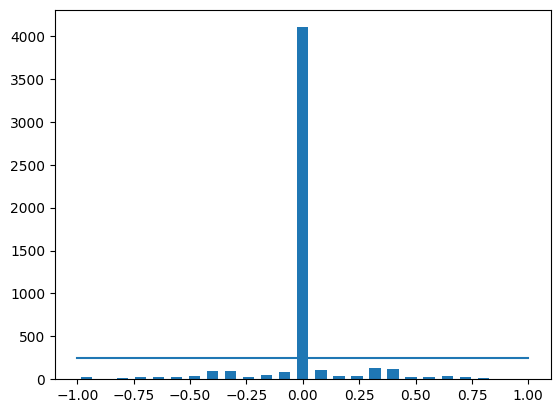

In [7]:
num_bins = 25
samples_per_bin = 250
hist, bins = np.histogram(data['steering'], num_bins)
center = (bins[:-1]+ bins[1:]) * 0.5
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))
print('total data:', len(data))
#dRAWING A THRESHOLD TO REMOVE ABOVE ANGLES TO PREVENT BAISING TO ZERO  ANGLE

removed: 3851
remaining: 1335


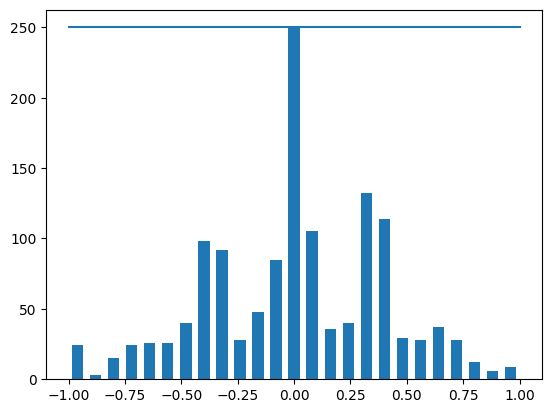

In [8]:
remove_list = []
for j in range(num_bins):
  list_ = []
  for i in range(len(data['steering'])):
    if data['steering'][i] >= bins[j] and data['steering'][i] <= bins[j+1]:
      list_.append(i)
  list_ = shuffle(list_)
  list_ = list_[samples_per_bin:]
  remove_list.extend(list_)

print('removed:', len(remove_list))
data.drop(data.index[remove_list], inplace=True)
print('remaining:', len(data))

hist, _ = np.histogram(data['steering'], (num_bins))
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))
#REMOVE IMAGE ABOVE THRESHOLD LINE

In [9]:
print(data.iloc[1])
def load_img_steering(datadir, df):
  image_path = []
  steering = []
  for i in range(len(data)):
    indexed_data = data.iloc[i]
    center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
    image_path.append(os.path.join(datadir, center.strip()))
    steering.append(float(indexed_data[3]))
    # left image append
    image_path.append(os.path.join(datadir,left.strip()))
    steering.append(float(indexed_data[3])+0.15)
    # right image append
    image_path.append(os.path.join(datadir,right.strip()))
    steering.append(float(indexed_data[3])-0.15)
  image_paths = np.asarray(image_path)
  steerings = np.asarray(steering)
  return image_paths, steerings
  #RETURNS CENTER IMAGES PATH AND STEERING ANGLE

center      center_2019_02_23_20_23_59_826.jpg
left        left_2019_02_23_20_23_59_826.jpg  
right       right_2019_02_23_20_23_59_826.jpg 
steering   -0.44499                           
throttle    1.0                               
reverse     0.0                               
speed       10.94113                          
Name: 25, dtype: object


Training Samples: 3204
Valid Samples: 801


Text(0.5, 1.0, 'Validation set')

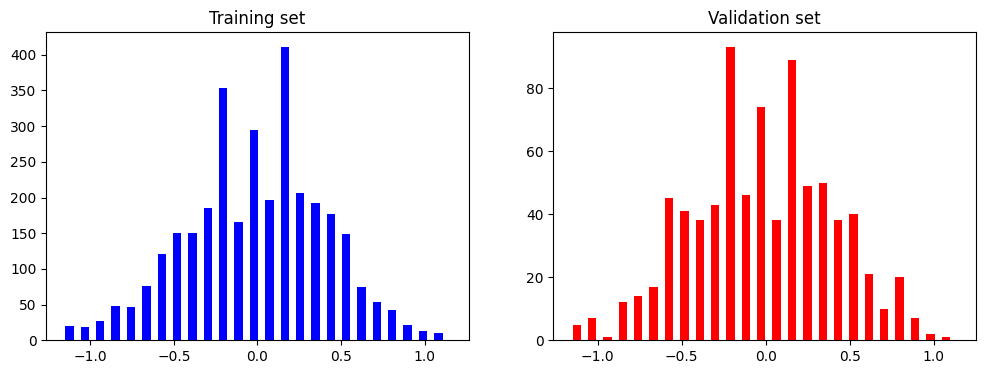

In [10]:
image_paths, steerings = load_img_steering(datadir + '/IMG', data)
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)
print('Training Samples: {}\nValid Samples: {}'.format(len(X_train), len(X_valid)))
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training set')
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Validation set')


In [11]:
def zoom(image):
  zoom = iaa.Affine(scale=(1, 1.3))
  image = zoom.augment_image(image)
  return image

Text(0.5, 1.0, 'Zoomed Image')

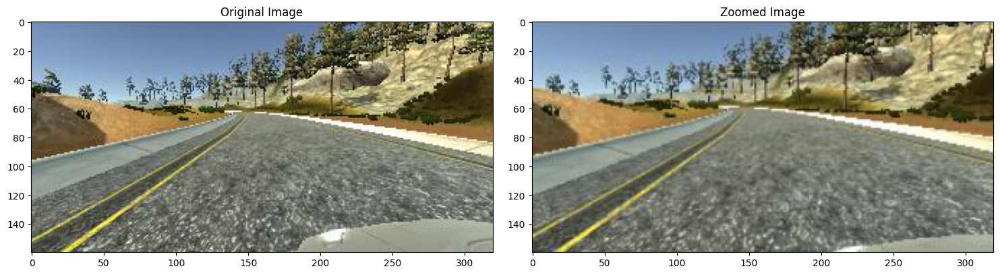

In [12]:
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')

In [13]:
def pan(image):
  pan = iaa.Affine(translate_percent= {"x" : (-0.1, 0.1), "y": (-0.1, 0.1)})
  image = pan.augment_image(image)
  return image


Text(0.5, 1.0, 'Panned Image')

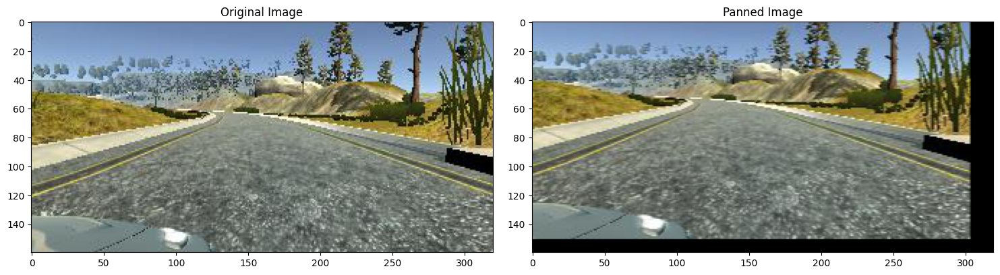

In [14]:
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')

In [15]:
def img_random_brightness(image):
    brightness = iaa.Multiply((0.2, 1.2))
    image = brightness.augment_image(image)
    return image

Text(0.5, 1.0, 'Brightness altered image ')

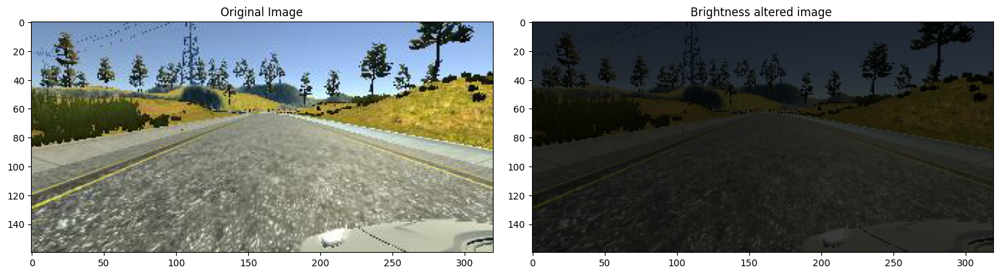

In [16]:
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness altered image ')

In [17]:
def img_random_flip(image, steering_angle):
    image = cv2.flip(image,1)
    steering_angle = -steering_angle
    return image, steering_angle

In [ ]:
random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]


original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image - ' + 'Steering Angle:' + str(steering_angle))

axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image - ' + 'Steering Angle:' + str(flipped_steering_angle))

In [19]:

def random_augment(image, steering_angle):
    image = mpimg.imread(image)
    if np.random.rand() < 0.5:
      image = pan(image)
    if np.random.rand() < 0.5:
      image = zoom(image)
    if np.random.rand() < 0.5:
      image = img_random_brightness(image)
    if np.random.rand() < 0.5:
      image, steering_angle = img_random_flip(image, steering_angle)

    return image, steering_angle

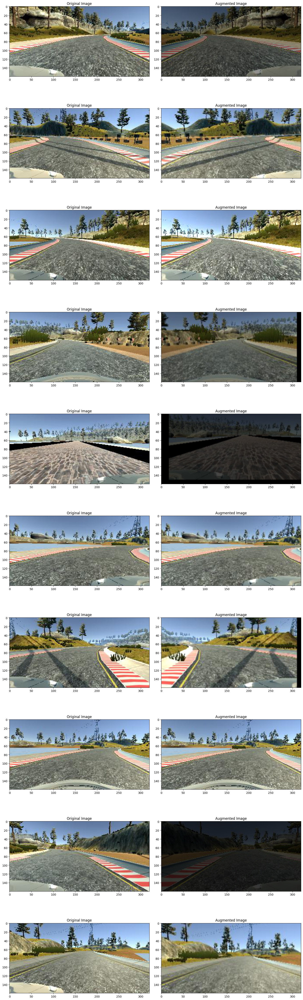

In [20]:
ncol = 2
nrow = 10

fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()

for i in range(10):
  randnum = random.randint(0, len(image_paths) - 1)
  random_image = image_paths[randnum]
  random_steering = steerings[randnum]

  original_image = mpimg.imread(random_image)
  augmented_image, steering = random_augment(random_image, random_steering)

  axs[i][0].imshow(original_image)
  axs[i][0].set_title("Original Image")

  axs[i][1].imshow(augmented_image)
  axs[i][1].set_title("Augmented Image")

In [21]:
def img_preprocess(img):
    img = img[60:135,:,:]
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img = cv2.GaussianBlur(img,  (3, 3), 0)
    img = cv2.resize(img, (200, 66))
    img = img/255
    return img

Text(0.5, 1.0, 'Preprocessed Image')

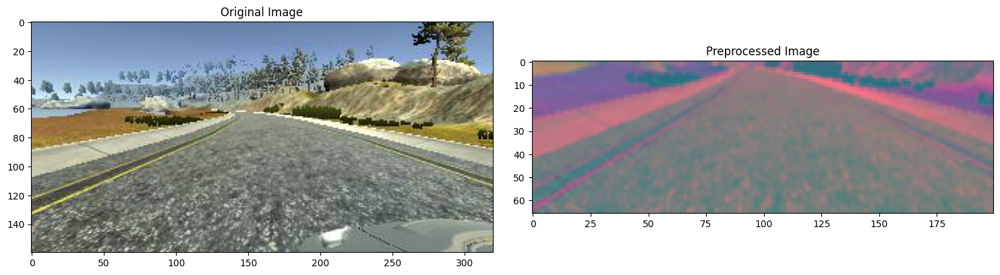

In [22]:
image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

In [23]:
def batch_generator(image_paths, steering_ang, batch_size, istraining):

  while True:
    batch_img = []
    batch_steering = []

    for i in range(batch_size):
      random_index = random.randint(0, len(image_paths) - 1)

      if istraining:
        im, steering = random_augment(image_paths[random_index], steering_ang[random_index])

      else:
        im = mpimg.imread(image_paths[random_index])
        steering = steering_ang[random_index]

      im = img_preprocess(im)
      batch_img.append(im)
      batch_steering.append(steering)
    yield (np.asarray(batch_img), np.asarray(batch_steering))

Text(0.5, 1.0, 'Validation Image')

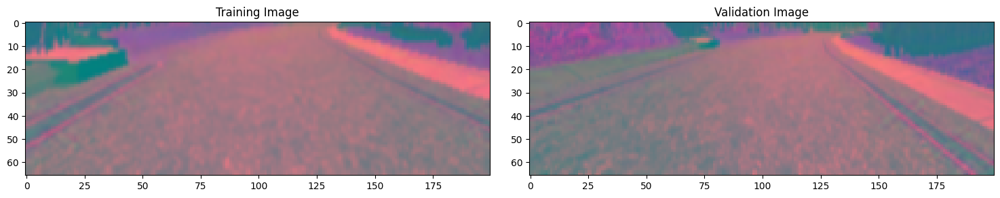

In [24]:
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')

axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

In [25]:
def nvidia_model():
  model = Sequential()
  model.add(Convolution2D(24,(5, 5), strides=(2, 2), input_shape=(66, 200, 3), activation='elu'))
  model.add(Convolution2D(36,(5, 5), strides=(2, 2), activation='elu'))
  model.add(Convolution2D(48,(5, 5), strides=(2, 2), activation='elu'))
  model.add(Convolution2D(64,(3, 3), activation='elu'))

  model.add(Convolution2D(64, 3, 3, activation='elu'))

  model.add(Flatten())

  model.add(Dense(100, activation = 'elu'))

  model.add(Dense(50, activation = 'elu'))

  model.add(Dense(10, activation = 'elu'))

  model.add(Dense(1))

  optimizer = Adam(lr=1e-3)
  model.compile(loss='mse', optimizer=optimizer)
  return model

In [26]:
model = nvidia_model()
print(model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 31, 98, 24)        1824      
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 47, 36)        21636     
                                                                 
 conv2d_2 (Conv2D)           (None, 5, 22, 48)         43248     
                                                                 
 conv2d_3 (Conv2D)           (None, 3, 20, 64)         27712     
                                                                 
 conv2d_4 (Conv2D)           (None, 1, 6, 64)          36928     
                                                                 
 flatten (Flatten)           (None, 384)               0         
                                                                 
 dense (Dense)               (None, 100)               3

/usr/local/lib/python3.10/dist-packages/keras/optimizers/legacy/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


In [27]:
history = model.fit_generator(batch_generator(X_train, y_train, 100, 1),
                                  steps_per_epoch=300,
                                  epochs=10,
                                  validation_data=batch_generator(X_valid, y_valid, 100, 0),
                                  validation_steps=200,
                                  verbose=1,
                                  shuffle = 1)

<ipython-input-27-1380e7fdc075>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(batch_generator(X_train, y_train, 100, 1),


Epoch 1/10
300/300 [==============================] - 373s 1s/step - loss: 0.1635 - val_loss: 0.1067
Epoch 2/10
300/300 [==============================] - 363s 1s/step - loss: 0.1142 - val_loss: 0.0994
Epoch 3/10
300/300 [==============================] - 358s 1s/step - loss: 0.1044 - val_loss: 0.0914
Epoch 4/10
300/300 [==============================] - 359s 1s/step - loss: 0.0990 - val_loss: 0.0781
Epoch 5/10
300/300 [==============================] - 356s 1s/step - loss: 0.0919 - val_loss: 0.0735
Epoch 6/10
300/300 [==============================] - 357s 1s/step - loss: 0.0885 - val_loss: 0.0879
Epoch 7/10
300/300 [==============================] - 357s 1s/step - loss: 0.0864 - val_loss: 0.0743
Epoch 8/10
300/300 [==============================] - 365s 1s/step - loss: 0.0830 - val_loss: 0.0686
Epoch 9/10
300/300 [==============================] - 356s 1s/step - loss: 0.0820 - val_loss: 0.0734
Epoch 10/10
300/300 [==============================] - 353s 1s/step - loss: 0.0811 - val_lo

Text(0.5, 0, 'Epoch')

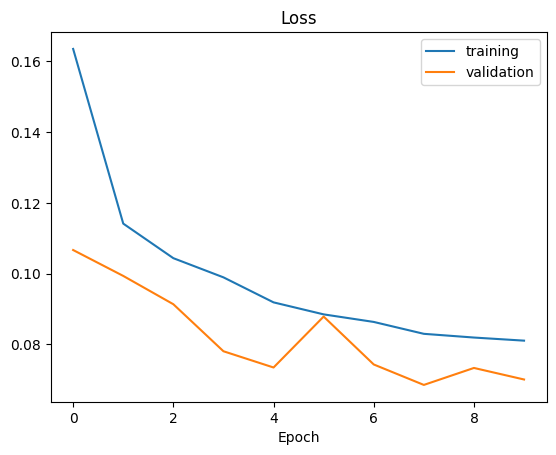

In [28]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel('Epoch')

In [29]:
model.save('newmodel.h5')

In [30]:
from google.colab import files
files.download('newmodel.h5')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>